<div style="text-align: left; font-weight: bold; font-size: 24px; line-height: 140%">Наполнение видео метаинформацией о нем с помощью нейронных сетей под задачи Image Captioning, Automated Speech Recognition. </div>

# Введение

В рамках данной работы продемонстрируем, каким образом наполняем исходные данные дополнительными атрибутами с помощью выбранных моделей и алгоритмической работы

Подгружаем / обновляем необходимые зависимоти для отображения работы функционала

In [1]:
!pip install torch transformers rouge_score evaluate datasets
!pip install keras
!pip install --upgrade keras
!pip install tensorflow --upgrade
!pip install --upgrade keras-nlp

In [2]:
# Для работы локально
!pip install tf-keras
!pip install opencv-python

Добавляем нужные импорты, которые необходимы для решения задачи

In [3]:
import random
import cv2
from pathlib import Path
import uuid
import shutil
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import whisperx
from datetime import timedelta


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/opt/anaconda3/lib/python3.11/site-packages/pyannote/audio/core/io.py:43: UserWarning: torchaudio._backend.set_audio_backend has been deprecated. With dispatcher enabled, this function is no-op. You can remove the function call.
  torchaudio.set_audio_backend("soundfile")


In [4]:
import requests
import torch
from PIL import Image
from transformers import *
from tqdm import tqdm
from tensorflow import keras
# set device to GPU if available
device = "cuda" if torch.cuda.is_available() else "cpu"

Конфигурируем Pandas для лучшего отображения

In [5]:
pd.set_option('max_colwidth', None)

Считываем датасет

In [6]:
#DATASET_PATH = '/kaggle/input/test_dir/2024_400k.csv'
DATASET_PATH = '../source_dataset.csv'
dataset = pd.read_csv(DATASET_PATH)
dataset.head()

,link,description
0,https://cdn-st.rutubelist.ru/media/b0/e9/ef285e0241139fc611318ed33071/fhd.mp4,"#нарезкистримов , #dota2 , #cs2 , #fifa23 , #minecraft , #майнкрафт , #геншин , #genshin"
1,https://cdn-st.rutubelist.ru/media/39/6c/b31bc6864bef9d8a96814f1822ca/fhd.mp4,🤫НЕ ВВОДИ ЭТУ КОМАНДУ В РОБЛОКС ! #shorts #roblox #роблокс
2,https://cdn-st.rutubelist.ru/media/e9/e0/b47a9df14a5e97942715e5e705c0/fhd.mp4,"#boobs , #красивыедевушки , #ass"
3,https://cdn-st.rutubelist.ru/media/87/43/b11df3f344d0af773aac81e410ee/fhd.mp4,NaN
4,https://cdn-st.rutubelist.ru/media/d1/e7/642dc2194fcdb69664f832d5f2dd/fhd.mp4,NaN


# Обогащение с помощью Image Captioning

Ниже объявим вспомогательные функции для работы с изображениями и прокоментируем каждую в коде

In [7]:
import urllib.parse as parse
import os

# функция, определяющая, является ли строка URL-адресом или нет
def is_url(string):
    try:
        result = parse.urlparse(string)
        return all([result.scheme, result.netloc, result.path])
    except:
        return False
    
# фукнция загрузки изображения
def load_image(image_path):
    if is_url(image_path):
        return Image.open(requests.get(image_path, stream=True).raw)
    elif os.path.exists(image_path):
        return Image.open(image_path)
        
# функция инференса
def get_caption(model, image_processor, tokenizer, image_path):
    image = load_image(image_path)
    # предобработка
    img = image_processor(image, return_tensors="pt").to(device)
    # генерируем описание
    output = model.generate(**img)
    # декодим вывод
    caption = tokenizer.batch_decode(output, skip_special_tokens=True)[0]
    return caption

Ниже заведем параметры для выбора энкодеров / декодеров. В результате исследований свой выбор остановили на энкодере от Microsoft- microsoft/swin-base-patch4-window7-224-in22k, декодере от Gpt - gpt 2. На всякий случай уточним, что данные реализации - OpenSource

In [8]:
# модель кодировщика, которая обрабатывает изображение и возвращает его фичи

# encoder_model = "WinKawaks/vit-small-patch16-224"
# encoder_model = "google/vit-base-patch16-224"
# encoder_model = "google/vit-base-patch16-224-in21k"
encoder_model = "microsoft/swin-base-patch4-window7-224-in22k"

# модель декодера, которая обрабатывает элементы изображения и генерирует текст подписи

# decoder_model = "bert-base-uncased"
# decoder_model = "prajjwal1/bert-tiny"
decoder_model = "gpt2"

Ниже проинициализируем токенайзер и обработчик изображений. Реализации так же OpenSource

In [9]:
# Инициализируем токенайзер
# tokenizer = AutoTokenizer.from_pretrained(decoder_model)
tokenizer = GPT2TokenizerFast.from_pretrained(decoder_model)
# tokenizer = BertTokenizerFast.from_pretrained(decoder_model)
# Загружаем обработчик изображений
image_processor = ViTImageProcessor.from_pretrained(encoder_model)

loading file vocab.json from cache at /Users/dandi/.cache/huggingface/hub/models--gpt2/snapshots/607a30d783dfa663caf39e06633721c8d4cfcd7e/vocab.json
loading file merges.txt from cache at /Users/dandi/.cache/huggingface/hub/models--gpt2/snapshots/607a30d783dfa663caf39e06633721c8d4cfcd7e/merges.txt
loading file tokenizer.json from cache at /Users/dandi/.cache/huggingface/hub/models--gpt2/snapshots/607a30d783dfa663caf39e06633721c8d4cfcd7e/tokenizer.json
loading file added_tokens.json from cache at None
loading file special_tokens_map.json from cache at None
loading file tokenizer_config.json from cache at /Users/dandi/.cache/huggingface/hub/models--gpt2/snapshots/607a30d783dfa663caf39e06633721c8d4cfcd7e/tokenizer_config.json
loading configuration file config.json from cache at /Users/dandi/.cache/huggingface/hub/models--gpt2/snapshots/607a30d783dfa663caf39e06633721c8d4cfcd7e/config.json
Model config GPT2Config {
  "_name_or_path": "gpt2",
  "activation_function": "gelu_new",
  "architectu

Далее подгружаем зафайнтюненую модель на COCO для image captioning. Модель взята с hugging face - https://huggingface.co/Abdou/vit-swin-base-224-gpt2-image-captioning

Тестируя и собирая разные модели перед стартом хакатона, выбор остановили на данной модели по следующим причинам:
- модель в ТОПе по следующим метрикам на COCO:
    - ROUGE. (rouge1, rouge2, rougeL, rougeLsum)
    - BLEU
    - на тестовой выборке loss ~ 0.8
- модель имеет простое API
- inference из под капота,что позволит сэкономить ресурсы для вычисления (не придется использовать GPU)

In [10]:
# Используя pipeline api
image_captioner = pipeline("image-to-text", model="Abdou/vit-swin-base-224-gpt2-image-captioning")
image_captioner.model = image_captioner.model.to(device)

loading configuration file config.json from cache at /Users/dandi/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b129b3c28efbaed3c169/config.json
Model config VisionEncoderDecoderConfig {
  "_name_or_path": "Abdou/vit-swin-base-224-gpt2-image-captioning",
  "architectures": [
    "VisionEncoderDecoderModel"
  ],
  "decoder": {
    "_name_or_path": "gpt2",
    "activation_function": "gelu_new",
    "add_cross_attention": true,
    "architectures": [
      "GPT2LMHeadModel"
    ],
    "attn_pdrop": 0.1,
    "bad_words_ids": null,
    "begin_suppress_tokens": null,
    "bos_token_id": 50256,
    "chunk_size_feed_forward": 0,
    "cross_attention_hidden_size": null,
    "decoder_start_token_id": null,
    "diversity_penalty": 0.0,
    "do_sample": false,
    "early_stopping": false,
    "embd_pdrop": 0.1,
    "encoder_no_repeat_ngram_size": 0,
    "eos_token_id": 50256,
    "exponential_decay_length_penalty": null,
    "finetunin

loading weights file model.safetensors from cache at /Users/dandi/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b129b3c28efbaed3c169/model.safetensors
Generate config GenerationConfig {
  "decoder_start_token_id": 50256,
  "eos_token_id": 50256,
  "pad_token_id": 50256
}

Generate config GenerationConfig {
  "bos_token_id": 50256,
  "eos_token_id": 50256
}

All model checkpoint weights were used when initializing VisionEncoderDecoderModel.

All the weights of VisionEncoderDecoderModel were initialized from the model checkpoint at Abdou/vit-swin-base-224-gpt2-image-captioning.
If your task is similar to the task the model of the checkpoint was trained on, you can already use VisionEncoderDecoderModel for predictions without further training.
loading configuration file generation_config.json from cache at /Users/dandi/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b1

Ниже опишем функцию, которая:
- нарезает видео на фреймы
- создает temp подкаталог, в которые прихранивает получившиеся фреймы. Сделали таким образом, чтобы не забивать место на диске и оперативку (RAM), храня изображение в рантайме
- делает предсказание и отрисосывает фрейм
- удаляет temp подкаталог

In [11]:
# Параметр, отвечающий за то, сколько фреймов резать за секунду
SAVING_FRAMES_PER_SECOND = 1
def format_timedelta(td):
    """Служебная функция для классного форматирования объектов timedelta (например, 00:00:20.05)
    исключая микросекунды и сохраняя миллисекунды"""
    result = str(td)
    try:
        result, ms = result.split(".")
    except ValueError:
        return result + ".00".replace(":", "-")
    ms = int(ms)
    ms = round(ms / 1e4)
    return f"{result}.{ms:02}".replace(":", "-")


def get_saving_frames_durations(cap, saving_fps):
    """Функция, которая возвращает список длительностей, в которые следует сохранять кадры."""
    s = []
    # получаем продолжительность клипа, разделив количество кадров на количество кадров в секунду
    clip_duration = cap.get(cv2.CAP_PROP_FRAME_COUNT) / cap.get(cv2.CAP_PROP_FPS)
    # используйте np.arange () для выполнения шагов с плавающей запятой
    for i in np.arange(0, clip_duration, 1 / saving_fps):
        s.append(i)
    return s


def get_prediction(video_file):
    uid = uuid.uuid1()
    dirname_str = '../' + str(uid) + '-opencv'
    dirname = Path(dirname_str)
    # создаем папку по названию видео файла
    if not os.path.isdir(dirname_str):
        dirname.mkdir(exist_ok=True)
    # создаем папку по названию видео файла
    # читать видео файл
    cap = cv2.VideoCapture(video_file)
    # получить FPS видео
    fps = cap.get(cv2.CAP_PROP_FPS)
    # если SAVING_FRAMES_PER_SECOND выше видео FPS, то установите его на FPS (как максимум)
    saving_frames_per_second = min(fps, SAVING_FRAMES_PER_SECOND)
    # получить список длительностей для сохранения
    saving_frames_durations = get_saving_frames_durations(cap, saving_frames_per_second)
    # запускаем цикл
    count = 0
    frame_insert_count = 1
    while True:
        is_read, frame = cap.read()
        if not is_read:
            # выйти из цикла, если нет фреймов для чтения
            break
        # получаем продолжительность, разделив количество кадров на FPS
        frame_duration = count / fps
        try:
            # получить самую раннюю продолжительность для сохранения
            closest_duration = saving_frames_durations[0]
        except IndexError:
            # список пуст, все кадры длительности сохранены
            break
        if frame_duration >= closest_duration:
            # если ближайшая длительность меньше или равна длительности кадра,
            # затем сохраняем фрейм
            # frame_duration_formatted = format_timedelta(timedelta(seconds=frame_duration))
            # only_file_name = filename.split("/")[-1]
            uid_frame = uuid.uuid1()
            frame_name = f"frame_{uid_frame}.jpg"
            frame_insert_count += 1

            cv2.imwrite(os.path.join(dirname_str, frame_name), frame)
            # удалить точку продолжительности из списка, так как эта точка длительности уже сохранена
            try:
                saving_frames_durations.pop(0)
            except IndexError:
                pass
        # увеличить количество кадров
        count += 1
    # объявим массив, в который будем складывать результаты предсказаний по фреймам
    result = []
    for _, _, filenames in os.walk(dirname_str):
        for filename in filenames:
            full_path = os.path.join(dirname_str, filename)
            file_result = show_image_and_captions(full_path)
            result.append(file_result)
    # удаляем temp директорию
    shutil.rmtree(dirname_str)
    # возвращаем описание фреймов
    return result

Практически все готово к тому, чтобы начать описывать изображения. Для того, чтобы продемонстрировать работу нашего алгоритма, создадим функцию, которая показывает кадр с видео, а также возвращает predict по нему.

In [12]:
def show_image_and_captions(url):
    # получаем изображение и отображаем его
    display(load_image(url))
    pipeline_caption = get_caption(image_captioner.model, image_processor, tokenizer, url)
    # отображаем полученный предикт
    print(f"Описание фрейма: {pipeline_caption}")
    # возвращаем предикт
    return pipeline_caption

Продемонстрируем работу алгоритма на 3 видео из выборки. Размер можете подредактировать самостоятельно, комментарием к строчке кода указано, как это сделать. Данное число выбрано с целью уменьшить визуальный шум, так как кол-во фреймов с видео 10+

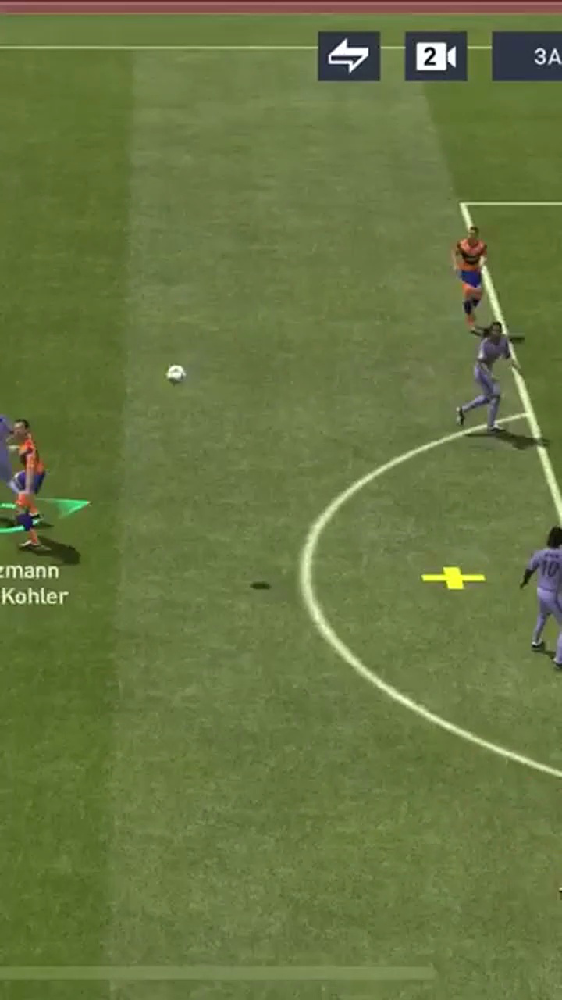

Описание фрейма: A group of people playing a game of soccer.


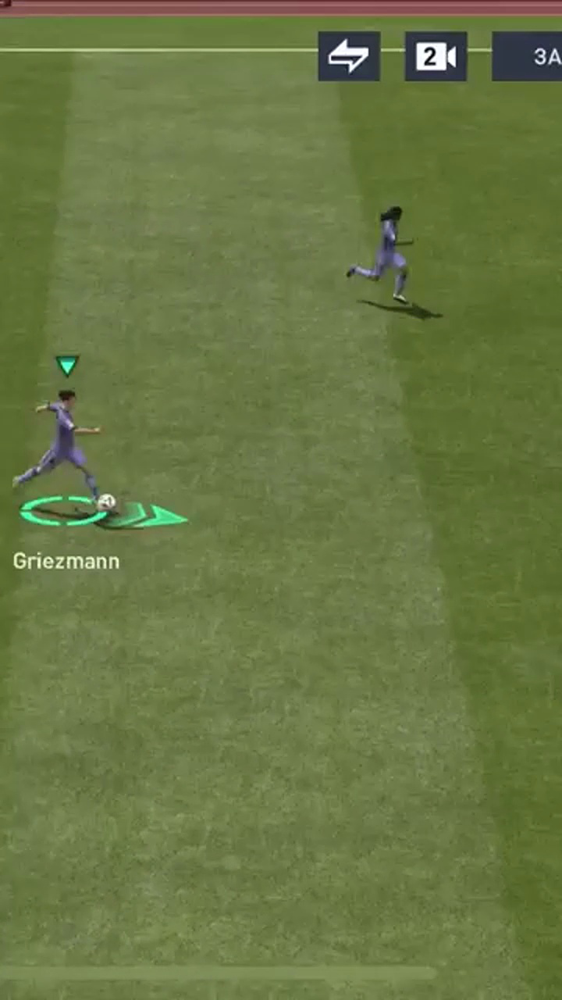

Описание фрейма: A baseball game in progress with a player on the field.


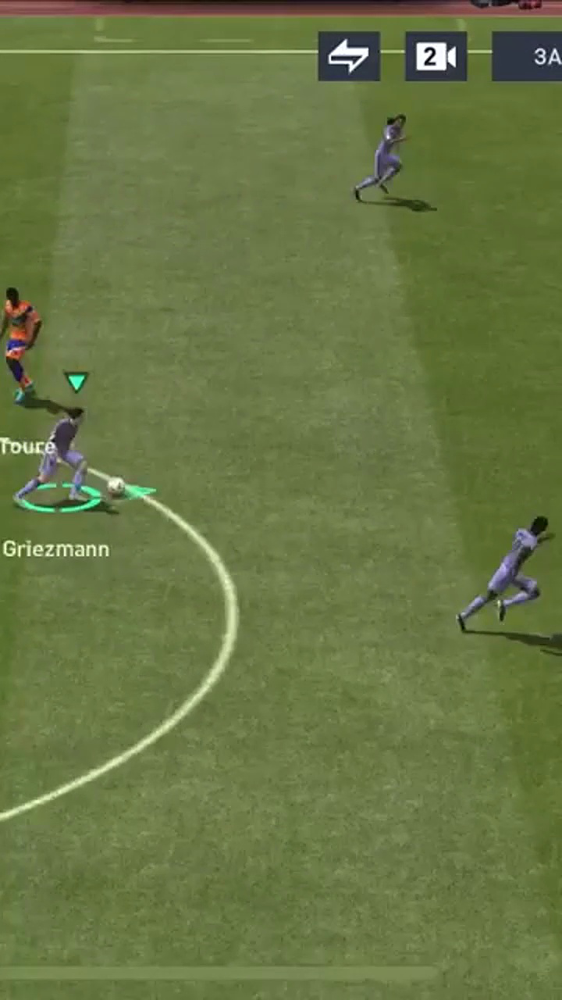

Описание фрейма: A group of men playing a game of baseball.


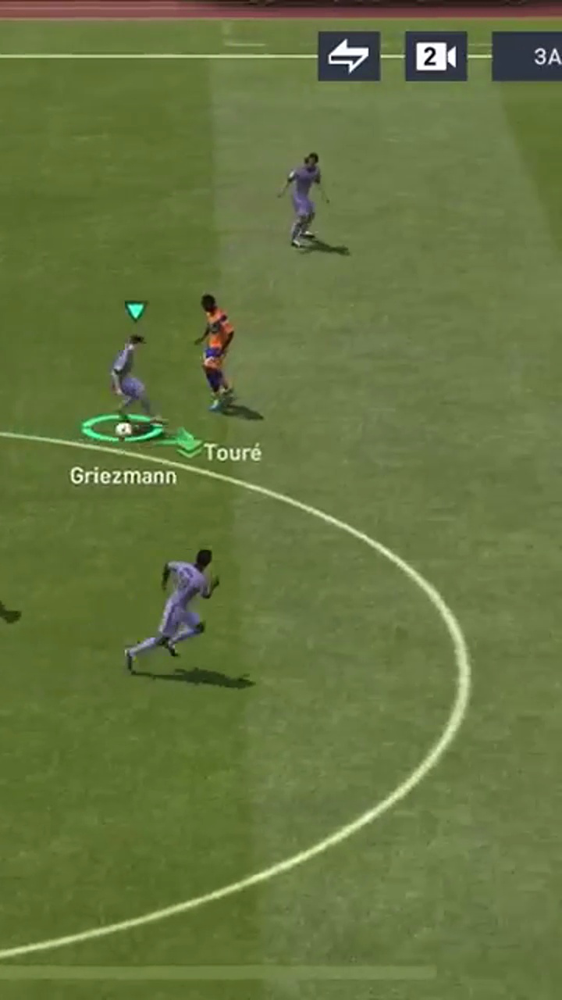

Описание фрейма: A soccer game with a player running to the ball.


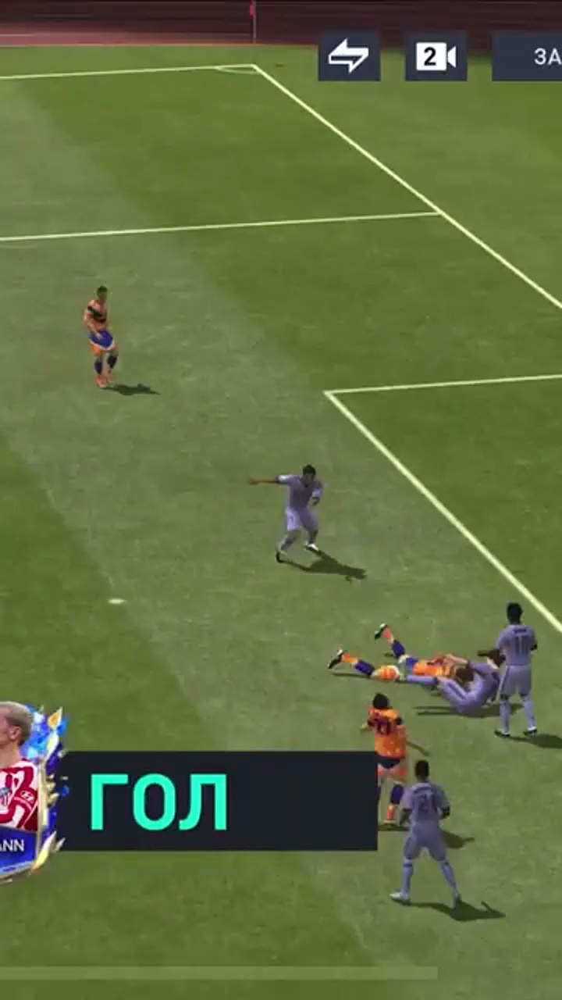

Описание фрейма: A group of men playing a game of soccer.


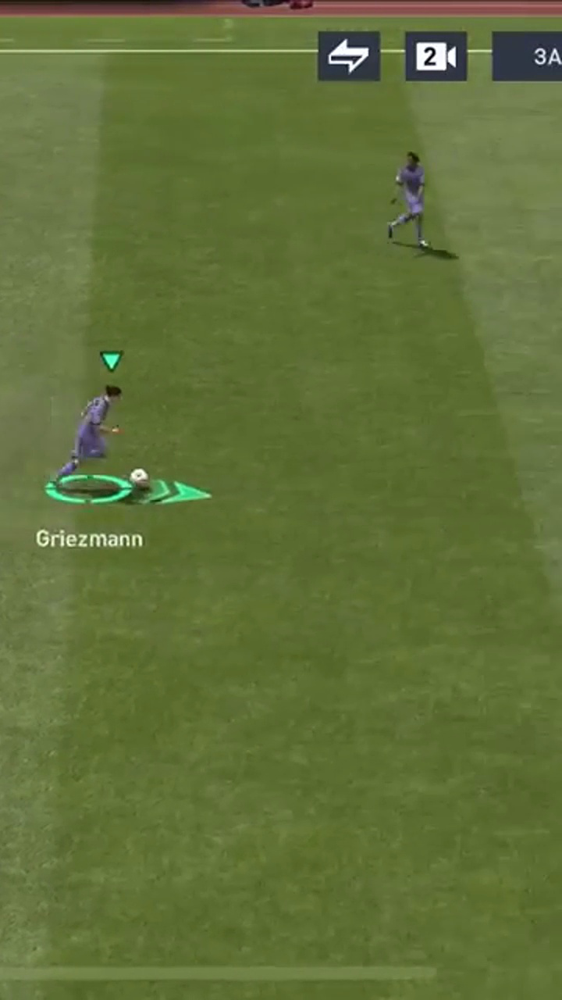

Описание фрейма: A man on a green field with a green and white dog.


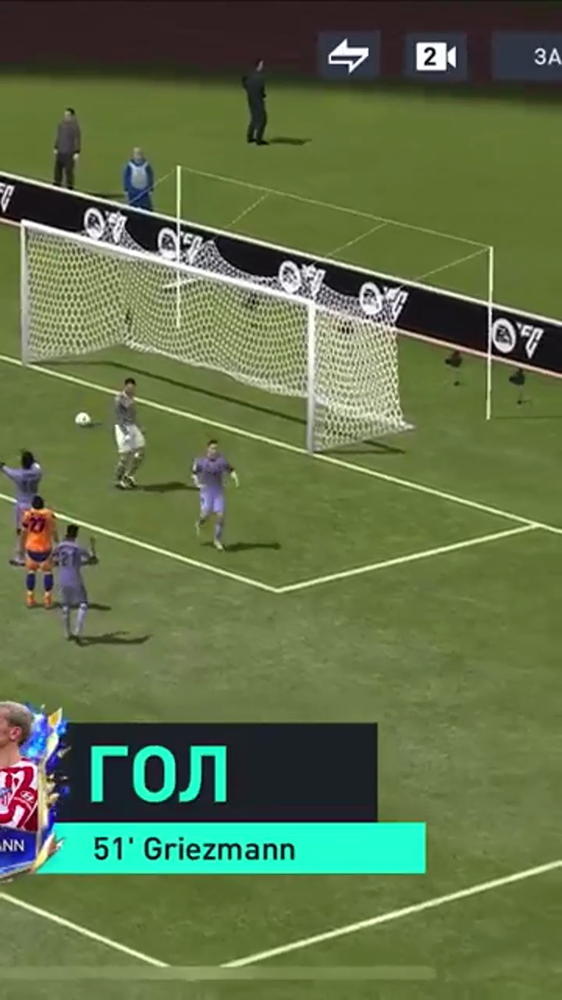

Описание фрейма: A group of people playing a game of soccer.


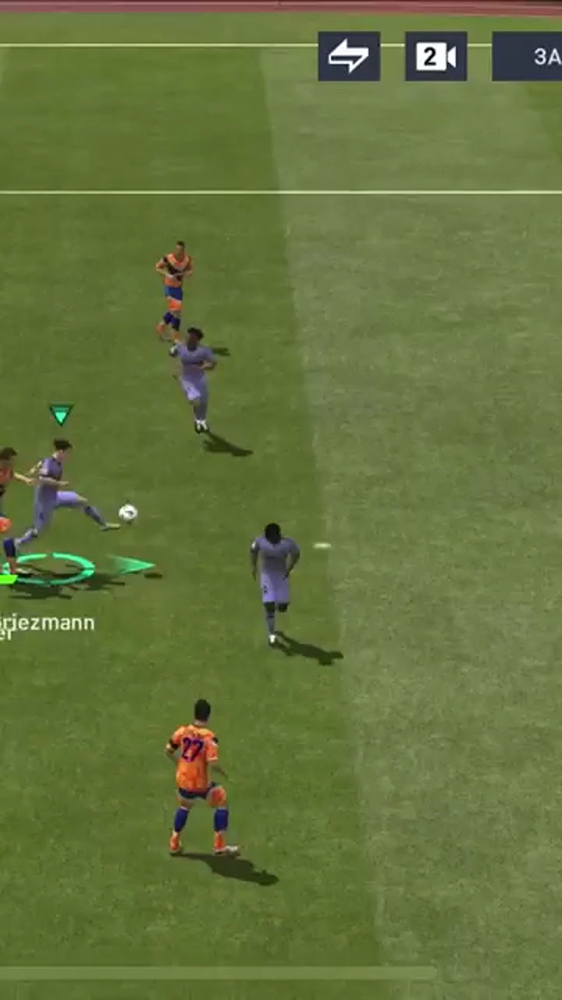

Описание фрейма: A group of people playing a game of soccer.


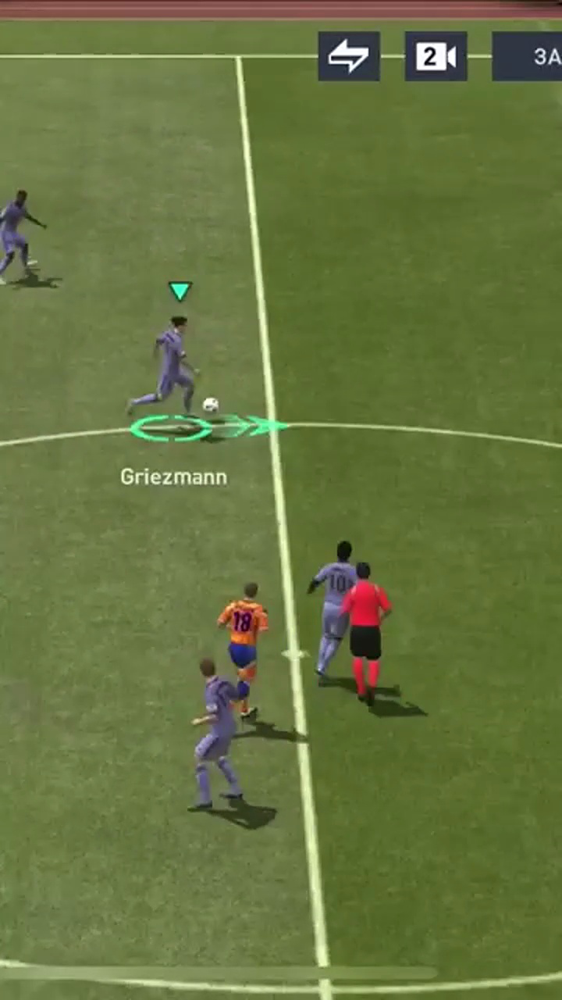

Описание фрейма: A group of men playing a game of soccer.


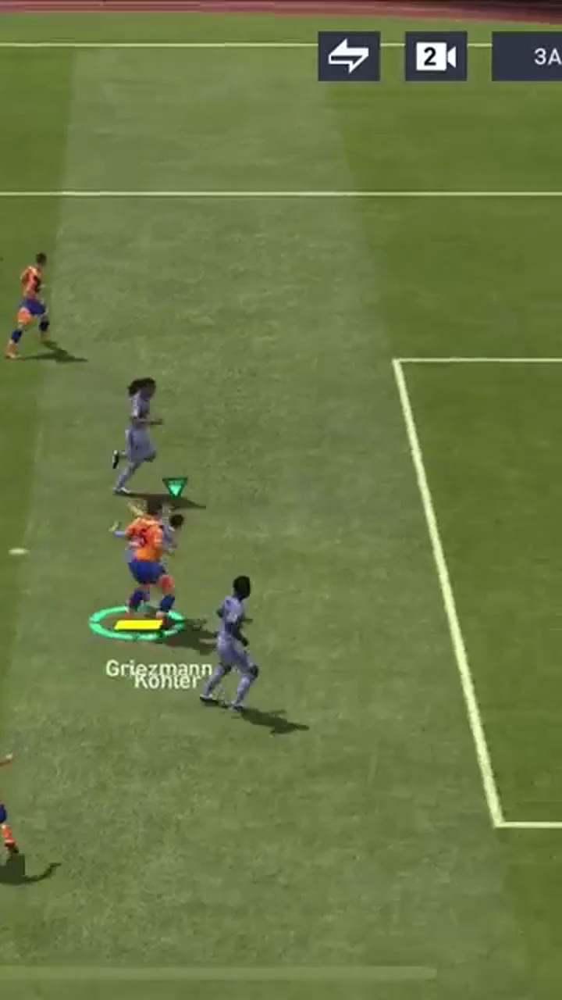

Описание фрейма: A group of people playing a game of soccer.


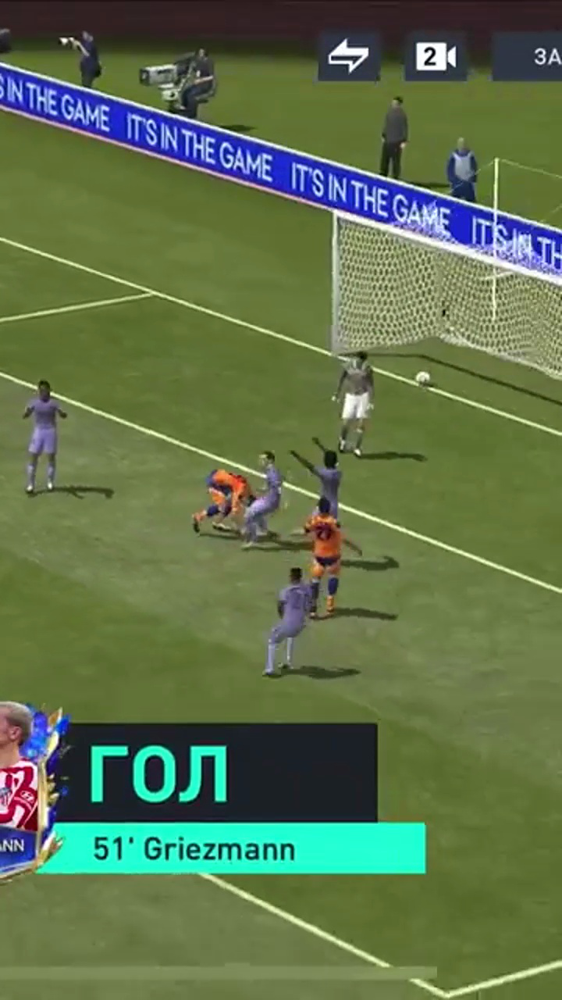

Описание фрейма: A group of people playing a game of soccer.


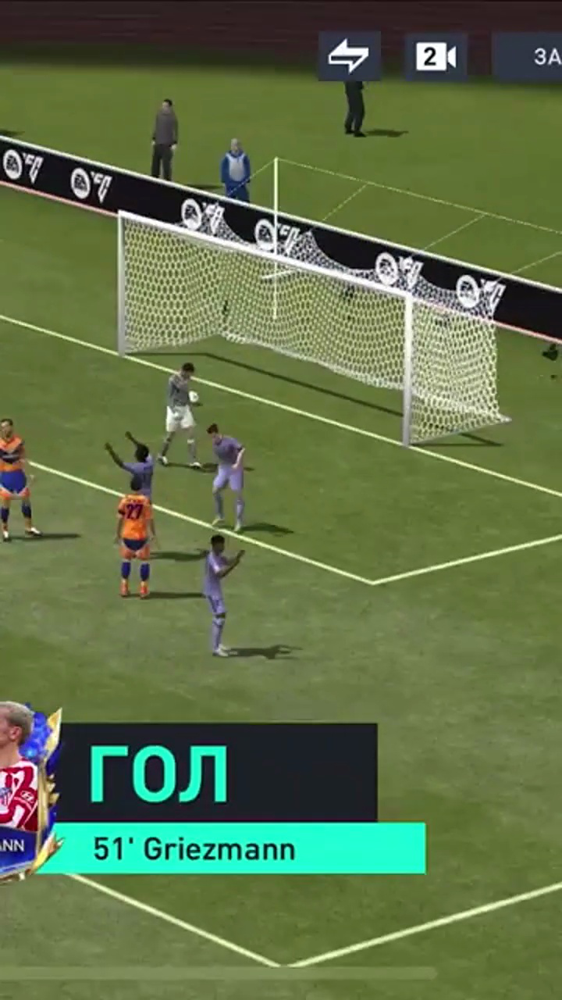

Описание фрейма: A group of people playing a game of soccer.


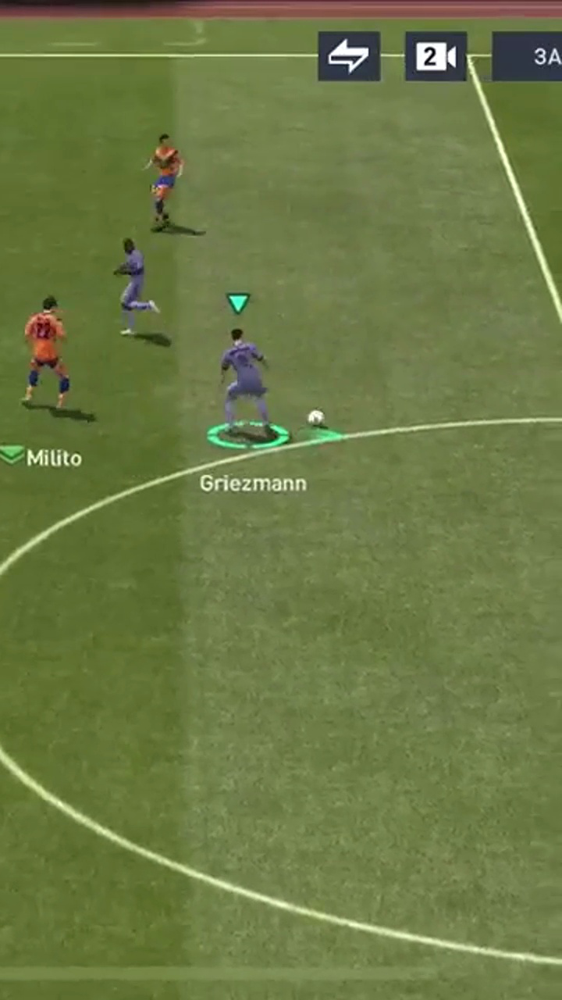

Описание фрейма: A group of people playing a game of soccer.


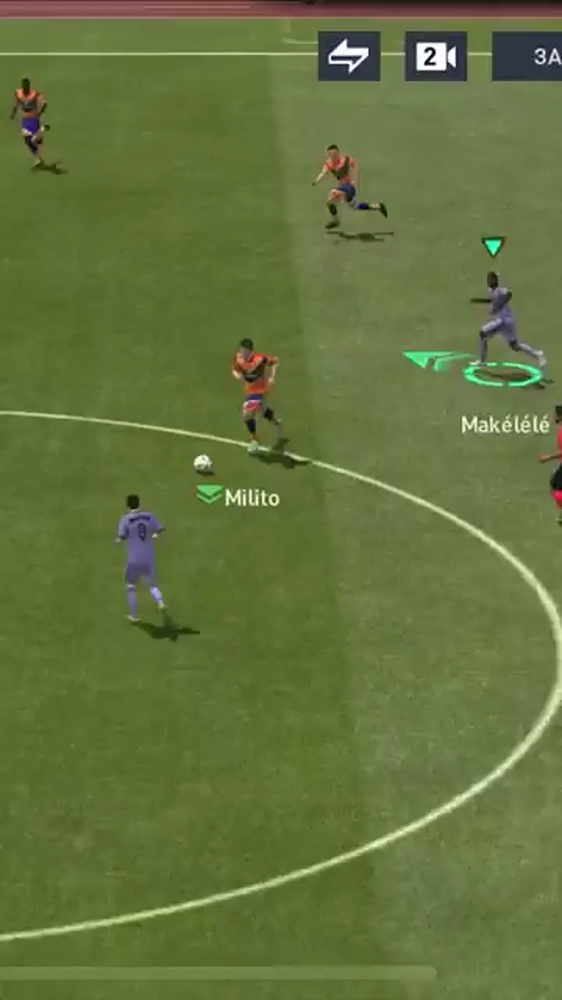

Описание фрейма: A group of people playing a game of soccer.


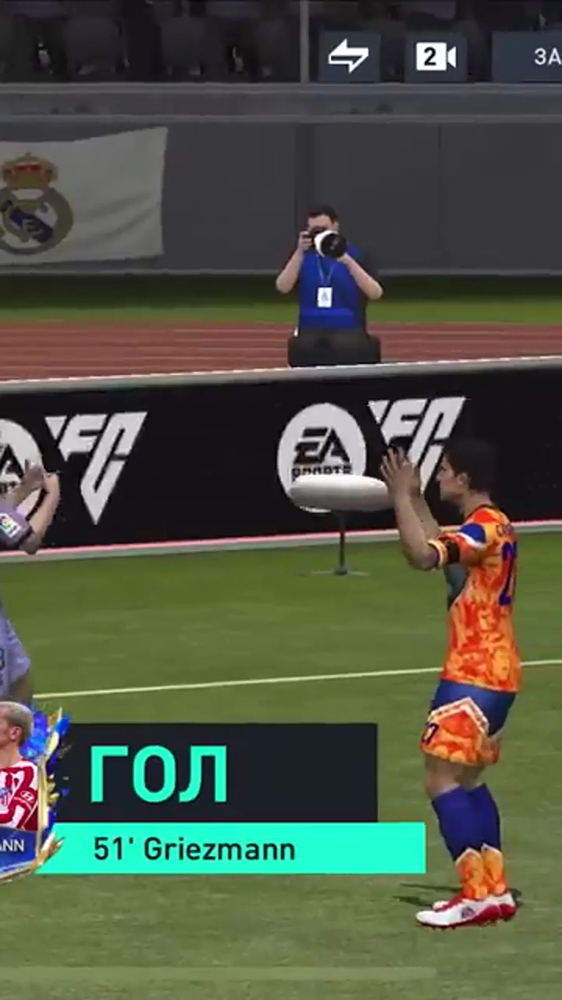

Описание фрейма: A woman in a blue shirt and orange shorts playing a game of soccer.


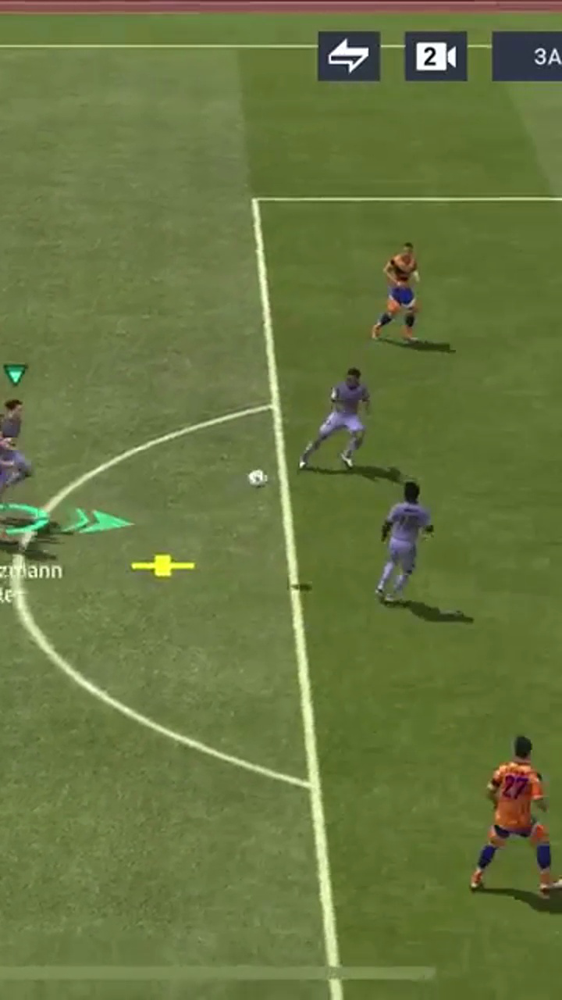

Описание фрейма: A group of kids playing soccer on a field.


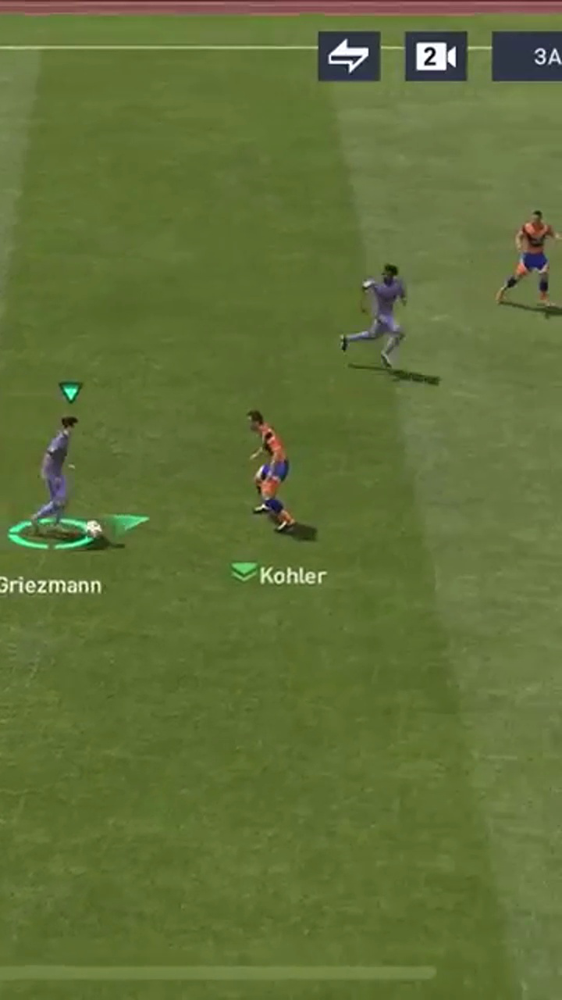

Описание фрейма: A group of people playing a game of baseball.


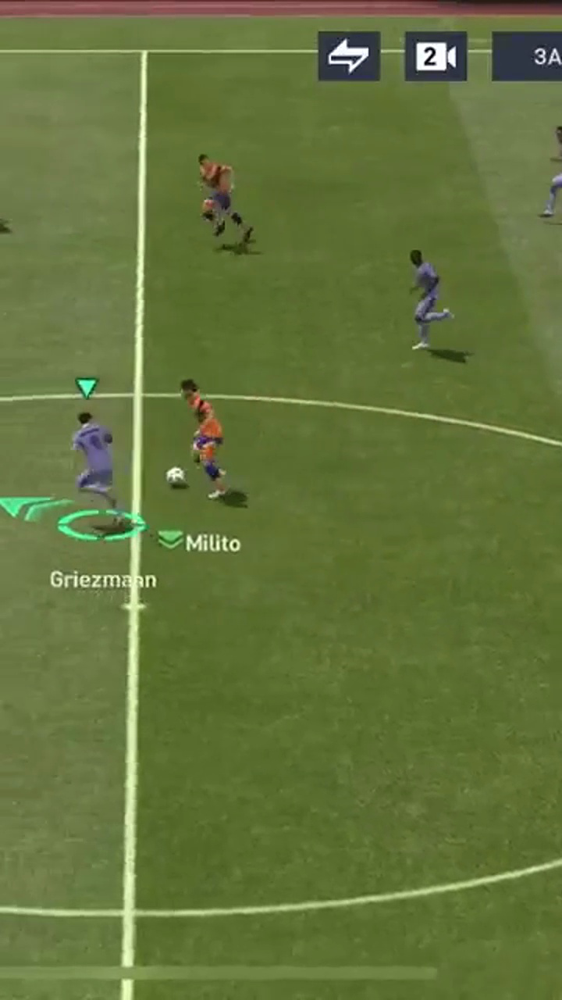

Описание фрейма: A group of people playing a game of soccer.


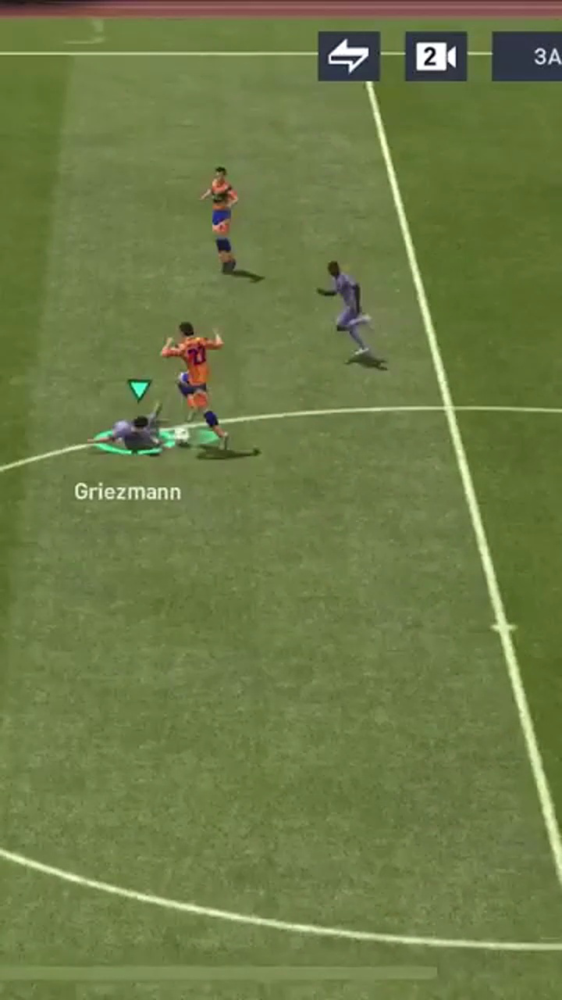

Описание фрейма: A group of kids playing soccer on a field.
Полученное описание видео: ['A group of people playing a game of soccer.', 'A baseball game in progress with a player on the field.', 'A group of men playing a game of baseball.', 'A soccer game with a player running to the ball.', 'A group of men playing a game of soccer.', 'A man on a green field with a green and white dog.', 'A group of people playing a game of soccer.', 'A group of people playing a game of soccer.', 'A group of men playing a game of soccer.', 'A group of people playing a game of soccer.', 'A group of people playing a game of soccer.', 'A group of people playing a game of soccer.', 'A group of people playing a game of soccer.', 'A group of people playing a game of soccer.', 'A woman in a blue shirt and orange shorts playing a game of soccer.', 'A group of kids playing soccer on a field.', 'A group of people playing a game of baseball.', 'A group of people playing a game of soccer.', 'A group of kids playing

In [13]:
# Здесь можно редактировать количество видео для обработки, а также сами видео. 
# Например, выставить range (5, 10), (20, 100) и т.д.
results = []
for i in range(0, 1):
    test_video = dataset['link'][i]
    result = get_prediction(test_video)
    print(f"Полученное описание видео: {result}")
    print(f"Количество фреймов: {len(result)}")
    results.append(result)
    

Как видно из последний строчки принта, существует две проблемы:
- Часто происходит такое, что описание по фреймам очень схоже или вообще идентично. Потенциально - это ухудшит качество поиска и в дублях нет необходимости. Соответственно, нужно написать алгоритм исключения похожих описаний из массива. 
- Модель генерирует описание на английском языке. Необходимо сделать корректный перевод на русский язык

## Решение проблем Image Captioning

Для начала напишем алгоритм для очистки дублей. Данный алгоритм необходимо написать так, чтобы асимптомическая сложность не превышала O(N), чтобы не перегружать CPU. 
- Преобразуем полученный массив описаний с фреймов в сет (коллекция неповторяющихся элементов). Таким образом, мы за линейную сложность убираем явные дубли
- Хотели также описать работу с неявными дублями, но сложность такого решения составит O(N^2) и было принято решение данный алгоритм не применять в данный момент. Опишем его псевдокодом, и, возможно, в будущем применим
    - После того, как создали сет, запускаем цикл со вложенным циклом
    - Во вложенном цикле сравниваем верхнюю строчку с нижней и берем минимальную длину
    - Смотрим, являются ли строчки по минимальной длине идентичными. В случае, если да, фиксируем индекс меньшей строки для того, чтобы в дальнейшем удалить ее
    - Если строчки таковыми не являются, запускаем посимвольное сравнение. Устанавливаем число, которое является показателем идентичности строки (например, 10). Собираем Словари (хеш-таблицу) символов для каждой строчки, где ключ - символ, значение - количество вхождений символа в строчку. Собираем общий диф по символам, и если он больше 10 - строки уникальны, оставляем обе. В противном случае удаляем меньшую

In [14]:
print(f"Исходное число фреймов {len(results[0])}")
print(f"Число фреймов после удаления явных дублей {len(set(results[0]))}")

Исходное число фреймов 19
Число фреймов после удаления явных дублей 9


Итак, мы видим, что даже такая оптизация гарантированно дает положительный результат. 
Также помимо этих проблем необходимо обратить внимание на то, что обработка одного видео и предсказания по нему занимают примерно ~10 секунд. При этом CPU грузится не сильно, поэтому было принято решение распаралелить сбор описаний в многопоточке. Код для этого присутствует в https://github.com/Dnal-c/etl-process/blob/main/main.py

Данное решение позволило кратно увеличивать скорость сбора данных, имея машину с 16 RAM, 12 CPU, смог в 8-10 раз ускорять сбор данных. То есть, говоря о цифрах
- до введения многопотчки за час собиралось 500 записей
- после введения многопоточки за час собиралось 4-5к записей в зависимости от CPU_COUNT в https://github.com/Dnal-c/etl-process/blob/main/global_env.py


Далее перейдем к разбору того, как делали перевод полученны описаний.
Для перевода воспользуемся open-source API от Google. Делаем это исключительно для хакатона, здесь гибкие и в дальнейшем можем подумать об альтернативных стратегиях. Так же в рамках хакатона установили, что Google API имеет rate limiter, поэтому перевод делали следующим образом:
- обращаемся к GoogleApi
- в случае падения по 429, переходим к https://pypi.org/project/translators/
- в случае падения транслятора, обращаемся к модели https://huggingface.co/Helsinki-NLP/opus-mt-en-ru которую прихраниваем локально

## Перевод полученных описаний

Устанавливаем через pip

In [15]:
!pip install googletrans==4.0.0-rc1

Далее настраиваем клиента и демонстрируем результат перевода

In [16]:
translate_model_name = "Helsinki-NLP/opus-mt-en-ru"
translator_tokenizer = AutoTokenizer.from_pretrained(translate_model_name)
translate_model = AutoModelForSeq2SeqLM.from_pretrained(translate_model_name).to(device)

loading configuration file config.json from cache at /Users/dandi/.cache/huggingface/hub/models--Helsinki-NLP--opus-mt-en-ru/snapshots/bb09c99d180016eac6819df3dae68edb1690fdee/config.json
Model config MarianConfig {
  "_name_or_path": "Helsinki-NLP/opus-mt-en-ru",
  "_num_labels": 3,
  "activation_dropout": 0.0,
  "activation_function": "swish",
  "add_bias_logits": false,
  "add_final_layer_norm": false,
  "architectures": [
    "MarianMTModel"
  ],
  "attention_dropout": 0.0,
  "bad_words_ids": [
    [
      62517
    ]
  ],
  "bos_token_id": 0,
  "classif_dropout": 0.0,
  "classifier_dropout": 0.0,
  "d_model": 512,
  "decoder_attention_heads": 8,
  "decoder_ffn_dim": 2048,
  "decoder_layerdrop": 0.0,
  "decoder_layers": 6,
  "decoder_start_token_id": 62517,
  "decoder_vocab_size": 62518,
  "dropout": 0.1,
  "encoder_attention_heads": 8,
  "encoder_ffn_dim": 2048,
  "encoder_layerdrop": 0.0,
  "encoder_layers": 6,
  "eos_token_id": 0,
  "forced_eos_token_id": 0,
  "id2label": {
    

In [17]:
import translators as ts
from googletrans import Translator

translator = Translator()
##ts.preaccelerate_and_speedtest()


def translate_frames_caption(source_texts):
    try:
        return translate_frames_caption_by_google(source_texts)
    except Exception as inst:
        print('Уперлись в rate-limiter google')
        try:
            return translate_frames_caption_by_open_ai(source_texts)
        except Exception as inst:
            print('Проблемы на OpenAI')
            print(type(inst))
            print(inst.args)
            print(inst)
            return translate_frames_caption_by_model(source_texts)


def translate_frames_caption_by_google(source_texts):
    translated_texts = []
    for source_text in source_texts:
        text = translator.translate(source_text, src='en', dest='ru')
        translated_texts.append(text.text)
    return translated_texts


def translate_frames_caption_by_open_ai(source_texts):
    translated_texts = []
    for source_text in source_texts:
        text = ts.translate_text(source_text, from_language='en', to_language='ru') #
        translated_texts.append(text)
    return translated_texts


def translate_frames_caption_by_model(source_texts):
    translated_texts = []
    for source_text in source_texts:
        inputs = translator_tokenizer(source_text, return_tensors="pt")
        output = translator_model.generate(**inputs, max_new_tokens=1000)
        out_text = translator_tokenizer.batch_decode(output, skip_special_tokens=True)[0]
        translated_texts.append(out_text)
    return translated_texts


In [18]:
from googletrans import Translator
translator = Translator()

source_texts = set(results[0])
translated_texts = []
for res in source_texts:
    text = translator.translate(res, src='en', dest='ru')
    translated_texts.append(text.text)
    
pd.DataFrame(data={
    'Исходный текст': list(source_texts),
    'Перевод': translated_texts
}).head(20)

,Исходный текст,Перевод
0,A group of men playing a game of baseball.,"Группа мужчин, играющих в игру в бейсбол."
1,A group of kids playing soccer on a field.,"Группа детей, играющих в футбол на поле."
2,A group of people playing a game of soccer.,"Группа людей, играющих в игру в футбол."
3,A group of people playing a game of baseball.,"Группа людей, играющих в игру в бейсбол."
4,A soccer game with a player running to the ball.,"Футбольная игра с игроком, бегущим к мячу."
5,A man on a green field with a green and white dog.,Человек на зеленом поле с зеленой и белой собакой.
6,A group of men playing a game of soccer.,"Группа мужчин, играющих в игру в футбол."
7,A baseball game in progress with a player on the field.,Бейсбольная игра в процессе с игроком на поле.
8,A woman in a blue shirt and orange shorts playing a game of soccer.,Женщина в синей рубашке и апельсиновые шорты играет в футбол.


Примерно таким образом будем осуществлять перевод полученных описаний под фреймы с видео. Из результатов выше видно, что перевод достаточно приемлимый. Возможно, в дальнейшем будем корректировать стратегию, и сводить каждое слово фразы в инфинитив для более точного поиска. В данный момент эта идея кажется избыточной, так как поисковым движком будет Elastic, умеющий решать эти проблемы.

После того, как описания с видео собраны, можем сделать следующее:
- построить атрибут **description_en**, объеденив полученные строчки
- построить атрибут **description_ru**, объеденив полученные переводы
- построить атрибут **short_description_en**, длинной 255 символов. Логика построения ниже
- построить атрибут **short_description_ru**, длинной 255 символов. Про данный атрибут распишем подробнее. Он будет необходим для того, чтобы выполнить дополнительное задание по автокомплиту во время ввода пользователя. Строить его будем следующим образом
    - рандомным образом выбираем описание из списка по видео
    - смотрим, больше ли оно чем 255 символов
        - если меньше, то добавляем в атрибут short_description as is
        - если больше, то обрезаем до 255 и бежим влево до тех пор, пока не встретим что-то из символов пробела, точки, или запятой, дабы привести атрибут в человекочитаемый вид

Ниже продемонстрируем, как будет выглядеть заполненные данные на примере одного видео

In [19]:
# функция для получения краткого описания
def get_short_description(string):
    i = 255
    if len(string) > 255:
        while i > 0:
            if len(string) > 255:
                if string[i] not in [' ', '.', ',']:
                    i -= 1
                else:
                    break
    return string[:i]

random_frame_number = random.randint(0, len(translated_texts)-1)
source_text_list = list(source_texts)
random_desc_en = source_text_list[random_frame_number]
short_description_en = get_short_description(random_desc_en)
random_desc_ru = translated_texts[random_frame_number]

display(f"Краткое описание видео на русском: {random_desc_ru}")
display(f"Краткое описание видео на английском: {random_desc_en}")

full_description_en = ' '.join(source_text_list)
full_description_ru = ' '.join(translated_texts)


'Краткое описание видео на русском: Человек на зеленом поле с зеленой и белой собакой.'

'Краткое описание видео на английском: A man on a green field with a green and white dog.'

In [20]:
print('Исходные данные')
display(pd.DataFrame(data=dataset.iloc[0]))

Исходные данные


,0
link,https://cdn-st.rutubelist.ru/media/b0/e9/ef285e0241139fc611318ed33071/fhd.mp4
description,"#нарезкистримов , #dota2 , #cs2 , #fifa23 , #minecraft , #майнкрафт , #геншин , #genshin"


In [21]:
print('Обогащенные данные')
advanced_row = {
    'link': dataset.iloc[0]['link'],
    'tags': dataset.iloc[0]['description'],
    'short_description_en': random_desc_en,
    'short_description_ru': random_desc_ru,
    'description_ru': full_description_ru,
    'description_en': full_description_en
}
dataframe_view = pd.DataFrame(data=[advanced_row])
dfStyler = dataframe_view.style.set_properties(**{'text-align': 'left'})
dfStyler.set_table_styles([dict(selector='th', props=[('text-align', 'left')])])
dfStyler.set_properties(**{"vertical-align": "text-top"})

Обогащенные данные


,link,tags,short_description_en,short_description_ru,description_ru,description_en
0,https://cdn-st.rutubelist.ru/media/b0/e9/ef285e0241139fc611318ed33071/fhd.mp4,"#нарезкистримов , #dota2 , #cs2 , #fifa23 , #minecraft , #майнкрафт , #геншин , #genshin",A man on a green field with a green and white dog.,Человек на зеленом поле с зеленой и белой собакой.,"Группа мужчин, играющих в игру в бейсбол. Группа детей, играющих в футбол на поле. Группа людей, играющих в игру в футбол. Группа людей, играющих в игру в бейсбол. Футбольная игра с игроком, бегущим к мячу. Человек на зеленом поле с зеленой и белой собакой. Группа мужчин, играющих в игру в футбол. Бейсбольная игра в процессе с игроком на поле. Женщина в синей рубашке и апельсиновые шорты играет в футбол.",A group of men playing a game of baseball. A group of kids playing soccer on a field. A group of people playing a game of soccer. A group of people playing a game of baseball. A soccer game with a player running to the ball. A man on a green field with a green and white dog. A group of men playing a game of soccer. A baseball game in progress with a player on the field. A woman in a blue shirt and orange shorts playing a game of soccer.


Таким образом, продемонстрированно, какой pipeline будет применем для обогащения данными с помощью решения задачи Image Captioning.

Далее перейдем к демонстрации того, как будем обогащать данные, транскрибируя текст с видео

# Обогащение с помощью Automatic Speech Recognition

В рамках исследований разных моделей удалось установить, что наиболее предпочтительной для хакатона будет являться модель Whisper, она OpenSource и лучшим образом зарекомендовала себя в рамках локальных тестов, а также на основе информации, полученной из открытых источников. Установим ее

In [22]:
!pip install git+https://github.com/m-bain/whisperx.git

  Cloning https://github.com/m-bain/whisperx.git to /private/var/folders/32/fhsprr_55v7_q3tl93lxvw1c0000gn/T/pip-req-build-i3_qexn4
  Running command git clone --filter=blob:none --quiet https://github.com/m-bain/whisperx.git /private/var/folders/32/fhsprr_55v7_q3tl93lxvw1c0000gn/T/pip-req-build-i3_qexn4
  Resolved https://github.com/m-bain/whisperx.git to commit f2da2f858e99e4211fe4f64b5f2938b007827e17
  Preparing metadata (setup.py) ... done


Также проверим, есть ли ffmpeg

In [23]:
!ffmpeg -version

ffmpeg version 7.0.1 Copyright (c) 2000-2024 the FFmpeg developers
built with Apple clang version 15.0.0 (clang-1500.3.9.4)
configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/7.0.1 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enab

Проинициализируем модель

In [24]:
compute_type = "float32"  
model = whisperx.load_model("large-v2", device=device, compute_type=compute_type)

Lightning automatically upgraded your loaded checkpoint from v1.5.4 to v2.2.5. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint ../../../.cache/torch/whisperx-vad-segmentation.bin`


No language specified, language will be first be detected for each audio file (increases inference time).
Model was trained with pyannote.audio 0.0.1, yours is 3.1.1. Bad things might happen unless you revert pyannote.audio to 0.x.
Model was trained with torch 1.10.0+cu102, yours is 2.3.0. Bad things might happen unless you revert torch to 1.x.


Далее опишем фукнцию, с помощью которой будем возвращать текст с видео

In [25]:

def transcribe_video(input_video):
    batch_size = 32 

    audio = whisperx.load_audio(input_video)
    result = model.transcribe(audio, batch_size=batch_size, language="ru")

    model_a, metadata = whisperx.load_align_model(language_code=result["language"], device=device)
    result = whisperx.align(result["segments"], model_a, metadata, audio, device, return_char_alignments=False)

    segments = result['segments']
    texts = []
    for seg in segments:
        texts.append(seg['text'])
    return ' '.join(texts)

In [26]:
test_link = dataset['link'][3]
result = transcribe_video(test_link)
print('')

loading configuration file preprocessor_config.json from cache at /Users/dandi/.cache/huggingface/hub/models--jonatasgrosman--wav2vec2-large-xlsr-53-russian/snapshots/2329100508896c6d9b157019803ab5601e6f3406/preprocessor_config.json
Feature extractor Wav2Vec2FeatureExtractor {
  "do_normalize": true,
  "feature_extractor_type": "Wav2Vec2FeatureExtractor",
  "feature_size": 1,
  "padding_side": "right",
  "padding_value": 0.0,
  "processor_class": "Wav2Vec2ProcessorWithLM",
  "return_attention_mask": true,
  "sampling_rate": 16000
}

Could not locate the tokenizer configuration file, will try to use the model config instead.
loading configuration file config.json from cache at /Users/dandi/.cache/huggingface/hub/models--jonatasgrosman--wav2vec2-large-xlsr-53-russian/snapshots/2329100508896c6d9b157019803ab5601e6f3406/config.json
Model config Wav2Vec2Config {
  "_name_or_path": "jonatasgrosman/wav2vec2-large-xlsr-53-russian",
  "activation_dropout": 0.05,
  "adapter_attn_dim": null,
  "ad

loading weights file pytorch_model.bin from cache at /Users/dandi/.cache/huggingface/hub/models--jonatasgrosman--wav2vec2-large-xlsr-53-russian/snapshots/2329100508896c6d9b157019803ab5601e6f3406/pytorch_model.bin
Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-russian were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_g', 'wav2vec2.encoder.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at jonatasgro

In [27]:
display(f'Результат выполнения: {result}')

'Результат выполнения:  Что он о тебе думает прямо сейчас? Слушай, думает, что ты, знаешь, для него непосильная ноша. Как будто бы, да, королева мечей. Чувствует то, что ты по характеру гораздо сильнее, и то, что ему с тобой будет очень сложно. Но при этом есть желания, и желания не совсем приличные. Проявляться боится, и, честно говоря, сам проявляться не будет.  Я бы на твоём месте вообще подумала, нужен ли тебе такой партнёр, который слабее тебя. Но выводы делай сама.'

Таким образом, в итоговый датасет с моделью будем добавлять новый атрибут 'text', в котором будут содержаться субтитры с видео. Итак, сбор данных описан, далее перейдем к описанию получения эмбедингов из этих данных

# Получение Эмбедингов

Для получения эмбедингов остановились на модели от SberDevices, которая также является OpenSource 
https://huggingface.co/ai-forever/sbert_large_nlu_ru

Продемонстрируем пример работы модели

In [28]:
class EmbeddingService:

    def __init__(self):
        # Load AutoModel from huggingface model repository
        tokenizer = AutoTokenizer.from_pretrained("ai-forever/sbert_large_nlu_ru")
        model = AutoModel.from_pretrained("ai-forever/sbert_large_nlu_ru")
        model = model.to(device)
        self.model = model
        self.tokenizer = tokenizer

    # Mean Pooling - Take attention mask into account for correct averaging
    def mean_pooling(self, model_output, attention_mask):
        token_embeddings = model_output[0]  # First element of model_output contains all token embeddings
        input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
        sum_embeddings = torch.sum(token_embeddings * input_mask_expanded, 1)
        sum_mask = torch.clamp(input_mask_expanded.sum(1), min=1e-9)
        return sum_embeddings / sum_mask

    def calc(self, text: str) -> np.ndarray:
        # Tokenize sentences
        encoded_input = self.tokenizer(
            text,
            padding=True,
            truncation=True,
            max_length=10000,
            return_tensors='pt').to(device)

        # Compute token embeddings
        with torch.no_grad():
            model_output = self.model(**encoded_input)

        # Perform pooling. In this case, mean pooling
        sentence_embeddings = self.mean_pooling(model_output, encoded_input['attention_mask'])
        return sentence_embeddings[0].cpu().detach().numpy()

In [29]:
service = EmbeddingService() 

loading configuration file config.json from cache at /Users/dandi/.cache/huggingface/hub/models--ai-forever--sbert_large_nlu_ru/snapshots/95c66a03e1cea189286bf8ba895999f1fd355d8c/config.json
Model config BertConfig {
  "_name_or_path": "ai-forever/sbert_large_nlu_ru",
  "architectures": [
    "BertModel"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "directionality": "bidi",
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 1024,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 16,
  "num_hidden_layers": 24,
  "pad_token_id": 0,
  "pooler_fc_size": 768,
  "pooler_num_attention_heads": 12,
  "pooler_num_fc_layers": 3,
  "pooler_size_per_head": 128,
  "pooler_type": "first_token_transform",
  "position_embedding_type": "absolute",
  "transformers_version": "4.39.3",
  "type_vocab_size":

In [30]:
captioning_embeding = service.calc(advanced_row['description_ru'])
speech_embeding = service.calc(result)
print('Пример посчитанного эмбединга от контента видео: ', captioning_embeding)
print('Пример посчитанного эмбединга от речи на видео: ', speech_embeding)

Пример посчитанного эмбединга от контента видео:  [ 0.94574815 -0.04628704 -0.71473384 ... -0.65007025  0.5477954
 -0.5778662 ]
Пример посчитанного эмбединга от речи на видео:  [ 0.21899009 -0.3262653   0.5362197  ...  0.1999268   0.36983323
  0.09546472]


Таким образом будем заполнять у записи атрибуты 'descripton_embedding', 'text_embedding'

# Заключение

Результатом данной работы было прозрачно отобразить существующий пайплан по наполнению видео метаинформацией. Таким образом, верхнеуровнево алгоритм следующий:
- берем ссылку на видео
- с помощью Image Captioning заполняем 4 атрибута - краткое описание на английском, русском и полное описание на английском, русском
- с помощью Automatic Speech Recognition заполняем субтитры
- берем полученные данные и получаем эмбединги от них, а также эмбединг от исходных тегов

Сам процесс будем запускать отдельно. Вижн такой, что:
- по наполнению исходной выборки дополнительными атрибутами будет ETL-процесс, который в дальнейшем, например, можно затащить в AirFlow и запускать по крону. Результатом процесса будет csv-файл с обогащенными данными
- также докрутим второй процесс, который будет загружать обогащенный csv файл в Elastic Тоже выглядит как таска, или отдельный даг в рамках AirFlow, например
